Let's start with a simple reaction-diffusion model
$$
\frac{\partial u }{\partial t} = D\nabla^2 u + r u(1-u)
$$

Aim in this, embarassingly simple, notebook is to get a grasp of how to model and simulate these systems.

In [40]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

So, what you gotta know is that there's spatial domain and temporal domain (for this particular PDE). So what you do is you discretize this continuous spatial domain and then make the individual spatial patches evolve through time. The "hyperparameters" we must set are the domain length, how many grid points (i.e., our discretization), and the time stepping scheme. Plus the diffusion coefficient $D$ and $r$.

In [41]:
# Parameters
L = 100 # domain length
Nx = 200 # number of grid points
Dx = L / Nx # grid spacing
Dt = 0.01 # time step
T = 50 # final time
steps = int(T / Dt)

D = 1.0 # diffusion coefficient
r = 0.5 # growth rate


# Spatial grid
x = np.linspace(0, L, Nx)

We must also specify the initial condition, here we are specifying a "bump"

In [42]:
u = np.zeros(Nx)
u[Nx//2 - 5 : Nx//2 + 5] = 0.5

Compute Laplacian and perform time integration

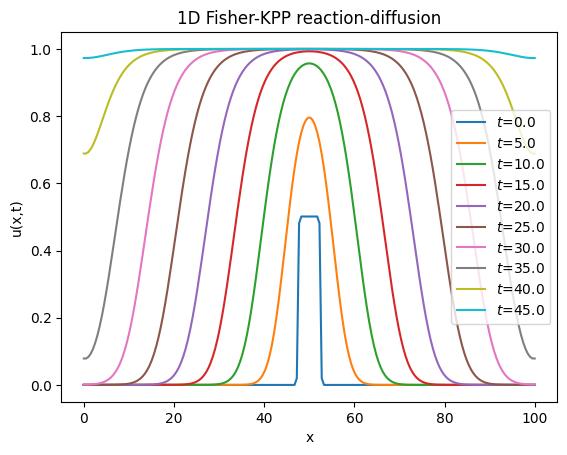

In [43]:
# Precompute Laplacian operator (second difference)
def laplacian(u, dx):
    return (np.roll(u, -1) - 2*u + np.roll(u, 1)) / dx**2


# Time integration
for n in range(steps):
    uxx = laplacian(u, Dx)
    reaction = r * u * (1 - u)
    u = u + Dt * (D * uxx + reaction)
    # Neumann (no-flux) boundaries
    u[0] = u[1]     # left edge copies its neighbor
    u[-1] = u[-2]   # right edge copies its neighbor


    if n % 500 == 0:
        plt.plot(x, u, label=f"$t$={n*Dt:.1f}")

plt.xlabel("x")
plt.ylabel("u(x,t)")
plt.legend()
plt.title("1D Fisher-KPP reaction-diffusion")
plt.show()

Now let's look at something a bit more complex, 2D diffusion. With the Gray-Scott model (upper case $U$ and $V$ just for convention).

$$\begin{align}
\frac{\partial U}{\partial t} &= D_u\nabla^2 U - UV^2 + F(1-U),\\
\frac{\partial V}{\partial t} &= D_v\nabla^2 V + UV^2 - (F + k)V
\end{align}$$

So now we have 2 substances that are interacting. Now you have "periodic" boundary conditions (guess maybe can help with the spiral)

$$
\begin{align}
    U(0, y, t) = U(L, y, t), \,\,\,\, V(0,y, t) = V(L, y ,t),\\
    U(x, 0, t) = U(x, L, t), \,\,\,\, V(x, 0, t) = V(x, L, t).
\end{align}
$$

We haven't really talked about the Laplacian, anyway, in this case it is approximated via finite differences (so we are assuming smoothness). By definition (in 2D) the Laplacian is

$$
\nabla^2 u(x,y) =\frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} 
$$

Assuming we compute it in a square region, with an equal discretization along the $x$ and $y$ axes i.e., $\Delta x = \Delta y = h$, on a grid $(i, j)$:

$$
\begin{align}
    \nabla^2 u_{i,j}\approx \frac{u_{i-1,j} + u_{i+1,j}+u_{i, j-1}+u_{i, j+1}-4u_{i,j}}{h^2}.
\end{align}
$$

We are assuming a $h = 1$ hence why you don't see it in the definition of Laplacian function. If that's not the case... then I have modified the code

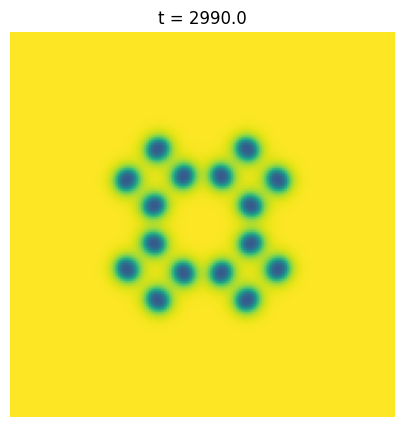

In [55]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parameters
Nx, Ny = 150, 150   
Du, Dv = 0.16, 0.08
F, k = 0.035, 0.065
Dt = 1.0
steps = 300  # number of animation frames

# Initialize concentrations
U = np.ones((Nx, Ny))
V = np.zeros((Nx, Ny))
r = 20  # size of initial square perturbation
U[Nx//2-r:Nx//2+r, Ny//2-r:Ny//2+r] = 0.50
V[Nx//2-r:Nx//2+r, Ny//2-r:Ny//2+r] = 0.25

# Discrete Laplacian with periodic BC
def laplacian(Z):
    return (np.roll(Z,1,axis=0) + np.roll(Z,-1,axis=0) +
            np.roll(Z,1,axis=1) + np.roll(Z,-1,axis=1) - 4*Z)

# Plot setup
fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(U, cmap='viridis', vmin=0, vmax=1)
ax.set_title("t = 0")
ax.axis("off")

# Update function for animation
def update(frame):
    global U, V
    for _ in range(10):  # multiple timesteps per frame
        Lu = laplacian(U)
        Lv = laplacian(V)
        reactionU = -U*V**2 + F*(1-U)
        reactionV = U*V**2 - (F+k)*V
        U += Dt*(Du*Lu + reactionU)
        V += Dt*(Dv*Lv + reactionV)
    im.set_data(U)
    ax.set_title(f"t = {frame*10*Dt}")
    return [im]

ani = FuncAnimation(fig, update, frames=steps, blit=True)
HTML(ani.to_jshtml())

Now let's try a more numerically stable implementation with fast Fourier transforms. But... why would our simulation blow up in the first place? Look at an explicit Euler step
$$
U^{n+1} = U^2+\Delta t(D_u \nabla^2 U + f(U, V)).
$$

$f(U, V)$ can produce large numbers and may grow too fast. Or the diffusion term (related to the Laplacian) can be a problem, since it scales like $D / (\Delta x)^2$, you want a small $\Delta x$. What about spectral methods?

Well, you can express everything in the frequency domain (recall your Fourier transform theory...), nice thing is you can apparently solve the forward Euler exactly!

Anyway, the Laplacian in frequency domain is just a multiplication by the corresponding frequency modulus (squared)

$$
\nabla^2 u(x, y)\xrightarrow{\text{FFT}} -k^2\hat{u}(k_x,k_y),
$$

where $k^2=k_x^2+k_y^2$ (the frequencies of each mode)





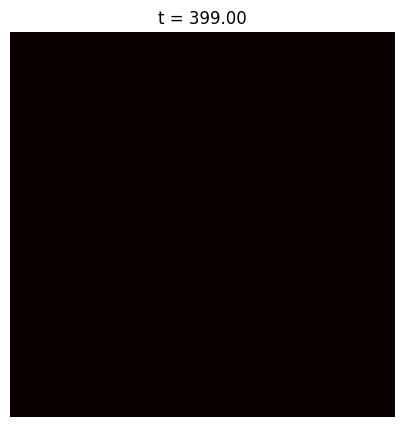

In [62]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --- Grid and parameters ---
Nx, Ny = 256, 256
Lx, Ly = 50.0, 50.0
dx, dy = Lx/Nx, Ly/Ny
Dt = 0.2  # smaller for stability
steps = 400

# FitzHugh-Nagumo parameters
Du, Dv = 1.0, 0.0
epsilon = 0.02
a, b = 0.8, 0.7

# --- Initialize fields ---
U = np.ones((Nx, Ny))  # activator
V = np.zeros((Nx, Ny))  # inhibitor

# Seed an asymmetric perturbation to create a spiral tip
r = 20
U[Nx//2-r:Nx//2+r, Ny//2:] = 0.5
V[Nx//2-r:Nx//2+r, Ny//2:] = 0.25

# --- Wavenumbers for FFT (periodic BCs) ---
kx = 2*np.pi*np.fft.fftfreq(Nx, d=dx)
ky = 2*np.pi*np.fft.fftfreq(Ny, d=dy)
KX, KY = np.meshgrid(kx, ky, indexing='ij')
K2 = KX**2 + KY**2

# --- Spectral diffusion ---
def spectral_diffusion(Z, D):
    Z_hat = np.fft.fft2(Z)
    Z_hat /= 1 + Dt*D*K2  # semi-implicit Euler
    return np.real(np.fft.ifft2(Z_hat))

# --- Plot setup ---
fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(U, cmap='hot', vmin=0, vmax=1)
ax.axis('off')
ax.set_title("t = 0")

# --- Update function ---
def update(frame):
    global U, V
    for _ in range(5):  # smaller inner steps for stability
        # Reaction
        reactionU = U - U**3/3 - V
        reactionV = epsilon*(U + a - b*V)
        U += Dt*reactionU
        V += Dt*reactionV

        # Diffusion via FFT
        U = spectral_diffusion(U, Du)
        V = spectral_diffusion(V, Dv)

        # Optional clipping to avoid numerical explosion
        U = np.clip(U, -2, 2)
        V = np.clip(V, -2, 2)

    im.set_data(U)
    ax.set_title(f"t = {frame*5*Dt:.2f}")
    return [im]

ani = FuncAnimation(fig, update, frames=steps, blit=True)
HTML(ani.to_jshtml())